In [ ]:
!pip install pinecone-client==3.2.2 sentence-transformers==2.7.0 datasets==2.19.0 faiss-cpu==1.8.0 transformers==4.40.1 openai==1.25.2 llama-index==0.10.34 llama-index-vector-stores-pinecone==0.1.6  -qqq

## 예제 12.1 실습 데이터 다운로드

In [ ]:
!wget ftp://ftp.irisa.fr/local/texmex/corpus/sift.tar.gz
!tar -xf sift.tar.gz


In [ ]:
!mkdir -p data/sift1M
!mv sift/* data/sift1M

In [15]:
%pip install -U openai

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


  Attempting uninstall: openai
    Found existing installation: openai 1.25.2
    Uninstalling openai-1.25.2:
      Successfully uninstalled openai-1.25.2
Note: you may need to restart the kernel to use updated packages.


## 예제 12.2 실습 데이터 불러오기

In [1]:
import psutil
import os

def get_memory_usage_mb():
    pid = os.getpid()
    process = psutil.Process(pid)
    memory_info = process.memory_info()
    return memory_info.rss / (1024 * 1024)

In [2]:
import time
import faiss
from faiss.contrib.datasets import DatasetSIFT1M

ds = DatasetSIFT1M()

xq = ds.get_queries()
xb = ds.get_database()
gt = ds.get_groundtruth()

## 예제 12.3 데이터가 늘어날 때 색인/검색 시간, 메모리 사용량 변화

In [3]:
k=1
d = xq.shape[1]
nq = 1000
xq = xq[:nq]

for i in range(1, 10, 2):
    start_memory = get_memory_usage_mb()
    start_indexing = time.time()
    index = faiss.IndexFlatL2(d)
    index.add(xb[:(i+1)*100000])
    end_indexing = time.time()
    end_memory = get_memory_usage_mb()

    t0 = time.time()
    D, I = index.search(xq, k)
    t1 = time.time()
    print(f"데이터 {(i+1)*100000}개:")
    print(f"색인: {(end_indexing - start_indexing) * 1000 :.3f} ms ({end_memory - start_memory:.3f} MB) 검색: {(t1 - t0) * 1000 / nq :.3f} ms")

데이터 200000개:
색인: 13.232 ms (97.688 MB) 검색: 0.153 ms
데이터 400000개:
색인: 20.089 ms (195.328 MB) 검색: 0.288 ms
데이터 600000개:
색인: 31.353 ms (0.000 MB) 검색: 0.435 ms
데이터 800000개:
색인: 36.819 ms (0.000 MB) 검색: 0.579 ms
데이터 1000000개:
색인: 43.982 ms (0.000 MB) 검색: 0.725 ms


## 예제 12.4 파라미터 m의 변경에 따른 성능 확인

In [4]:
import numpy as np

k=1
d = xq.shape[1]
nq = 1000
xq = xq[:nq]

for m in [8, 16, 32, 64]:
    index = faiss.IndexHNSWFlat(d, m)
    time.sleep(3)
    start_memory = get_memory_usage_mb()
    start_index = time.time()
    index.add(xb)
    end_memory = get_memory_usage_mb()
    end_index = time.time()
    print(f"M: {m} - 색인 시간: {end_index - start_index} s, 메모리 사용량: {end_memory - start_memory} MB")

    t0 = time.time()
    D, I = index.search(xq, k)
    t1 = time.time()

    recall_at_1 = np.equal(I, gt[:nq, :1]).sum() / float(nq)
    print(f"{(t1 - t0) * 1000.0 / nq:.3f} ms per query, R@1 {recall_at_1:.3f}")

M: 8 - 색인 시간: 10.820121765136719 s, 메모리 사용량: 283.90625 MB
0.005 ms per query, R@1 0.710
M: 16 - 색인 시간: 12.365416765213013 s, 메모리 사용량: 27.53125 MB
0.006 ms per query, R@1 0.780
M: 32 - 색인 시간: 25.433025121688843 s, 메모리 사용량: 265.015625 MB
0.013 ms per query, R@1 0.896
M: 64 - 색인 시간: 37.438673973083496 s, 메모리 사용량: 507.90625 MB
0.015 ms per query, R@1 0.940


## 예제 12.5 ef_construction을 변화시킬 때 성능 확인

In [8]:
k=1
d = xq.shape[1]
nq = 1000
xq = xq[:nq]

for ef_construction in [40, 80, 160, 320]:
    index = faiss.IndexHNSWFlat(d, 32)
    index.hnsw.efConstruction = ef_construction
    time.sleep(3)
    start_memory = get_memory_usage_mb()
    start_index = time.time()
    index.add(xb)
    end_memory = get_memory_usage_mb()
    end_index = time.time()
    print(f"efConstruction: {ef_construction} \n - 색인 시간: {(end_index - start_index):.3f} s, 메모리 사용량: {(end_memory - start_memory):.3f} MB")

    t0 = time.time()
    D, I = index.search(xq, k)
    t1 = time.time()

    recall_at_1 = np.equal(I, gt[:nq, :1]).sum() / float(nq)
    print(f" - 검색 시간: {(t1 - t0) * 1000.0 / nq:.3f} ms per query, R@1 {recall_at_1:.3f}")

efConstruction: 40 
 - 색인 시간: 24.442 s, 메모리 사용량: 923.781 MB
 - 검색 시간: 0.009 ms per query, R@1 0.890
efConstruction: 80 
 - 색인 시간: 27.631 s, 메모리 사용량: 0.969 MB
 - 검색 시간: 0.009 ms per query, R@1 0.873
efConstruction: 160 
 - 색인 시간: 55.419 s, 메모리 사용량: 26.500 MB
 - 검색 시간: 0.008 ms per query, R@1 0.895
efConstruction: 320 
 - 색인 시간: 107.904 s, 메모리 사용량: 7.766 MB
 - 검색 시간: 0.010 ms per query, R@1 0.910


## 예제 12.6 ef_search 변경에 따른 성능 확인

In [9]:
for ef_search in [16, 32, 64, 128]:
    index.hnsw.efSearch = ef_search
    t0 = time.time()
    D, I = index.search(xq, k)
    t1 = time.time()

    recall_at_1 = np.equal(I, gt[:nq, :1]).sum() / float(nq)
    print(f"{(t1 - t0) * 1000.0 / nq:.3f} ms per query, R@1 {recall_at_1:.3f}")

0.014 ms per query, R@1 0.910
0.021 ms per query, R@1 0.967
0.034 ms per query, R@1 0.989
0.055 ms per query, R@1 0.995


## 예제 12.7 파인콘 계정 연결 및 인덱스 생성

In [6]:
from pinecone import Pinecone, ServerlessSpec

# pinecone_api_key = "자신의 API 키를 입력"
pc = Pinecone() # (api_key=pinecone_api_key)


In [7]:
if 'llm-book' not in [index['name'] for index in pc.list_indexes().indexes]:
    pc.create_index("llm-book", dimension=768, metric="cosine", spec=ServerlessSpec("aws", "us-east-1"))

index = pc.Index('llm-book')

## 예제 12.8 임베딩 생성

In [2]:
from datasets import load_dataset
from sentence_transformers import SentenceTransformer
# 임베딩 모델 불러오기
sentence_model = SentenceTransformer('snunlp/KR-SBERT-V40K-klueNLI-augSTS')
# 데이터셋 불러오기
klue_dp_train = load_dataset('klue', 'dp', split='train[:100]')

embeddings = sentence_model.encode(klue_dp_train['sentence'])

/Users/1004506/Work/code/langchain-academy/lc-academy-env/lib/python3.12/site-packages/huggingface_hub/file_download.py:795: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
/Users/1004506/Work/code/langchain-academy/lc-academy-env/lib/python3.12/site-packages/huggingface_hub/file_download.py:795: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


In [5]:
embeddings.shape

(100, 768)

## 예제 12.9 파인콘 입력을 위한 데이터 형태 변경

In [ ]:
# 파이썬 기본 데이터 타입으로 변경
embeddings_lst = embeddings.tolist()
# {"id": 문서 ID(str), "values": 벡터 임베딩(List[float]), "metadata": 메타 데이터(dict) ) 형태로 데이터 준비


In [ ]:

insert_data = []
for idx, (embedding, text) in enumerate(zip(embeddings_lst, klue_dp_train['sentence'])):
  insert_data.append({"id": str(idx), "values": embedding, "metadata": {'text': text}})

## 예제 12.10 임베딩 데이터를 인덱스에 저장

In [10]:
upsert_response = index.upsert(vectors = insert_data, namespace='llm-book-sub')

## 예제 12.11 인덱스 검색하기

In [13]:
embeddings[0]

array([-1.1007341 ,  0.2204788 ,  0.7423545 ,  0.40755203,  0.40845358,
       -0.5668343 ,  0.12040877,  0.9611377 ,  0.12286762,  0.08036394,
       -0.26953006,  1.0635223 ,  0.79961276, -0.6526372 ,  0.28084466,
        0.29893714,  0.34992328, -0.30015868, -0.22010314,  0.14338458,
        0.49921143,  0.6308045 ,  0.7327808 ,  0.15622814,  0.6172428 ,
        0.2938288 ,  0.23889607, -0.08779256, -0.17289309,  0.015028  ,
        0.7184013 , -0.60096556,  0.8250127 ,  0.1790279 , -0.00346299,
       -0.5063711 ,  0.26079154,  0.36623275, -0.17332576, -0.39004844,
       -0.9089296 ,  0.546785  ,  0.548228  , -0.37852538, -0.74716806,
       -0.928566  ,  0.2788316 ,  0.23320068,  0.56668216,  0.32917878,
        0.50552034, -0.642183  , -0.7404398 , -0.59538424,  0.8819692 ,
        0.29714718,  0.21641718, -0.09734184,  0.15031211, -0.38114843,
        0.61799836, -0.7551858 , -0.10069708, -0.53693867,  0.08692121,
        0.16132182, -1.4413276 ,  0.3718567 ,  0.0043077 , -0.36

In [ ]:
query_response = index.query(
    namespace='llm-book-sub', # 검색할 네임스페이스
    top_k=10, # 몇 개의 결과를 반환할지
    include_values=True, # 벡터 임베딩 반환 여부
    include_metadata=True, # 메타 데이터 반환 여부
    vector=embeddings_lst[0] # 검색할 벡터 임베딩 => Not NumPy arrays, but list of numbers or json-compatible data
)

query_response

{'matches': [{'id': '0',
              'metadata': {'text': '해당 그림을 보면 디즈니 공주들이 브리트니 스피어스의 앨범이나 뮤직비디오, '
                                   '화보 속 모습을 똑같이 재연했다.'},
              'score': 0.999999881,
              'values': [-1.10073411,
                         0.220478803,
                         0.742354512,
                         0.407552034,
                         0.408453584,
                         -0.566834271,
                         0.120408766,
                         0.961137712,
                         0.122867621,
                         0.0803639442,
                         -0.269530058,
                         1.06352234,
                         0.799612761,
                         -0.652637184,
                         0.280844659,
                         0.298937142,
                         0.349923283,
                         -0.300158679,
                         -0.220103145,
                         0.143384576,
                         0.499211431

## 예제 12.12 파인콘에서 문서 수정 및 삭제

In [ ]:
new_text = '변경할 새로운 텍스트'
new_embedding = sentence_model.encode(new_text).tolist()
# 업데이트
update_response = index.update(
    id= '기존_문서_id',
    values=new_embedding,
    set_metadata={'text': new_text},
    namespace='llm-book-sub'
)

# 삭제
delete_response = index.delete(ids=['기존_문서_id'], namespace='llm-book-sub')

In [15]:
new_text = '변경할 새로운 텍스트'
new_embedding = sentence_model.encode(new_text).tolist()
# 업데이트
update_response = index.update(
    id= '0',
    values=new_embedding,
    set_metadata={'text': new_text},
    namespace='llm-book-sub'
)


In [16]:

# 삭제
delete_response = index.delete(ids=['0'], namespace='llm-book-sub')

## 예제 12.13 라마인덱스에서 다른 벡터 데이터베이스 사용

In [ ]:
# 파인콘 기본 설정
from pinecone import Pinecone, ServerlessSpec

pc = Pinecone() #(api_key=pinecone_api_key)
pc.create_index(
    "quickstart", dimension=1536, metric="euclidean", spec=ServerlessSpec("aws", "us-east-1")
)
pinecone_index = pc.Index("quickstart")

# 라마인덱스에 파인콘 인덱스 연결
from llama_index.core import VectorStoreIndex
from llama_index.vector_stores.pinecone import PineconeVectorStore
from llama_index.core import StorageContext

vector_store = PineconeVectorStore(pinecone_index=pinecone_index)
storage_context = StorageContext.from_defaults(vector_store=vector_store)
index = VectorStoreIndex.from_documents(
    documents, storage_context=storage_context
)

## 예제 12.14 실습 데이터셋 다운로드

In [17]:
from datasets import load_dataset

dataset = load_dataset("poloclub/diffusiondb", "2m_first_1k", split='train', trust_remote_code=True)

example_index = 867
original_image = dataset[example_index]['image']
original_prompt = dataset[example_index]['prompt']
print(original_prompt)

# cute fluffy baby cat rabbit lion hybrid mixed creature character concept,
# with long flowing mane blowing in the wind, long peacock feather tail,
# wearing headdress of tribal peacock feathers and flowers, detailed painting,
# renaissance, 4 k

cute fluffy baby cat rabbit lion hybrid mixed creature character concept, with long flowing mane blowing in the wind, long peacock feather tail, wearing headdress of tribal peacock feathers and flowers, detailed painting, renaissance, 4 k 


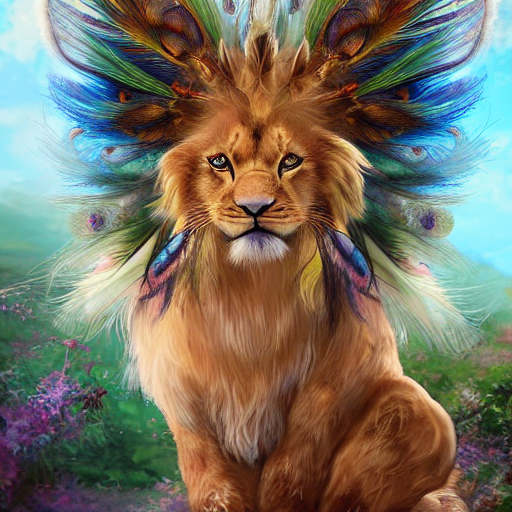

In [18]:
original_image

## 예제 12.15 GPT-4o 요청에 사용할 함수

In [19]:
from openai import OpenAI

client = OpenAI()

In [25]:
import requests
import base64
from io import BytesIO

def make_base64(image):
  buffered = BytesIO()
  image.save(buffered, format="JPEG")
  img_str = base64.b64encode(buffered.getvalue()).decode('utf-8')
  return img_str

def generate_description_from_image_gpt4(prompt, image64):
  headers = {
      "Content-Type": "application/json",
      "Authorization": f"Bearer {client.api_key}"
  }
  payload = {
      "model": "gpt-4o",
      "messages": [
        {
          "role": "user",
          "content": [
            {
              "type": "text",
              "text": prompt
            },
            {
              "type": "image_url",
              "image_url": {
                "url": f"data:image/jpeg;base64,{image64}"
              }
            }
          ]
        }
      ],
      "max_tokens": 300
  }
  response_oai = requests.post("https://api.openai.com/v1/chat/completions", headers=headers, json=payload)
  result = response_oai.json()['choices'][0]['message']['content']
  return result

## 예제 12.16 이미지 설명 생성

In [4]:
image_base64 = make_base64(original_image)
described_result = generate_description_from_image_gpt4("Describe provided image", image_base64)
described_result
# The image depicts a digitally created, fantastical creature that combines features of different animals. It has the body and face of a lion, with a rich, golden mane that transitions into an array of vibrant, peacock-like feathers. The feathers themselves are full of brilliant colors, primarily blues and greens, with "eyes" that mimic the look of a peacock's plumage. The creature is sitting down and facing forward with a calm and majestic expression.
# The creature is set against a picturesque backdrop that resembles a lush, blooming meadow or garden, with rolling green hills in the distance and a blue sky above. The colors are rich and the composition is balanced, emphasizing the surreal and regal aspect of the creature. It's an imaginative piece that blends the natural elements of these animals in a mystical way.
# 이 이미지는 다양한 동물의 특징을 결합한 디지털로 창조된 환상적인 생물을 묘사합니다. 이 동물은 사자의 몸과 얼굴을 하고 있으며, 풍성한 황금빛 갈기가 공작새와 같은 생생한 깃털로 변합니다. 깃털은 주로 파란색과 녹색의 화려한 색상으로 가득하며, 공작의 깃털을 닮은 '눈'이 있습니다. 이 생물은 차분하고 장엄한 표정으로 앉아서 정면을 바라보고 있습니다.
# 이 생물은 무성하고 꽃이 만발한 초원이나 정원을 연상시키는 그림 같은 배경을 배경으로 멀리 푸른 언덕이 펼쳐져 있고 위로는 푸른 하늘이 펼쳐져 있습니다. 색상이 풍부하고 구도가 균형 잡혀 있어 초현실적이고 당당한 생물의 모습을 강조합니다. 동물의 자연적 요소를 신비로운 방식으로 혼합한 상상력이 돋보이는 작품입니다.

'The image depicts a majestic lion with an immensely elaborate mane made of vibrant, peacock-like feathers. The background features a lush, colorful landscape with soft blue skies and various shades of green and purple flora. The lion sits regally, exuding an aura of mythical beauty and power, combining elements of both lion and peacock traits for a fantastical effect.'

## 예제 12.17 클라이언트 준비

In [26]:
import os
from openai import OpenAI
from pinecone import Pinecone, ServerlessSpec

# pinecone_api_key = pinecone_api_key # '자신의 파인콘 API 키 입력'
# openai_api_key = '자신의 OpenAI API 키 입력'

pc = Pinecone() #(api_key=pinecone_api_key)
# os.environ["OPENAI_API_KEY"] = openai_api_key
client = OpenAI()

## 예제 12.18 인덱스 생성

In [27]:
print(pc.list_indexes())

index_name = "llm-multimodal"
try:
  pc.create_index(
    name=index_name,
    dimension=512,
    metric="cosine",
    spec=ServerlessSpec(
      "aws", "us-east-1"
    )
  )
  print(pc.list_indexes())
except:
  print("Index already exists")
index = pc.Index(index_name)

{'indexes': [{'dimension': 1536,
              'host': 'shopping-assistant-kzdr58s.svc.aped-4627-b74a.pinecone.io',
              'metric': 'cosine',
              'name': 'shopping-assistant',
              'spec': {'serverless': {'cloud': 'aws', 'region': 'us-east-1'}},
              'status': {'ready': True, 'state': 'Ready'}},
             {'dimension': 768,
              'host': 'llm-book-kzdr58s.svc.aped-4627-b74a.pinecone.io',
              'metric': 'cosine',
              'name': 'llm-book',
              'spec': {'serverless': {'cloud': 'aws', 'region': 'us-east-1'}},
              'status': {'ready': True, 'state': 'Ready'}}]}
{'indexes': [{'dimension': 512,
              'host': 'llm-multimodal-kzdr58s.svc.aped-4627-b74a.pinecone.io',
              'metric': 'cosine',
              'name': 'llm-multimodal',
              'spec': {'serverless': {'cloud': 'aws', 'region': 'us-east-1'}},
              'status': {'ready': True, 'state': 'Ready'}},
             {'dimension': 153

## 예제 12.19 프롬프트 텍스트를 텍스트 임베딩 모델을 활용해 임베딩 벡터로 변환

In [28]:
import torch
from tqdm.auto import trange
from torch.utils.data import DataLoader
from transformers import AutoTokenizer, CLIPTextModelWithProjection

device = "cuda" if torch.cuda.is_available() else "cpu"

text_model = CLIPTextModelWithProjection.from_pretrained("openai/clip-vit-base-patch32")
tokenizer = AutoTokenizer.from_pretrained("openai/clip-vit-base-patch32")

tokens = tokenizer(dataset['prompt'], padding=True, return_tensors="pt", truncation=True)
batch_size = 16
text_embs = []
for start_idx in trange(0, len(dataset), batch_size):
    with torch.no_grad():
        outputs = text_model(input_ids = tokens['input_ids'][start_idx:start_idx+batch_size],
                        attention_mask = tokens['attention_mask'][start_idx:start_idx+batch_size])
        text_emb_tmp = outputs.text_embeds
    text_embs.append(text_emb_tmp)
text_embs = torch.cat(text_embs, dim=0)
text_embs.shape # (1000, 512)

/Users/1004506/Work/code/langchain-academy/lc-academy-env/lib/python3.12/site-packages/huggingface_hub/file_download.py:795: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

  0%|          | 0/63 [00:00<?, ?it/s]

torch.Size([1000, 512])

In [ ]:
new_text = '변경할 새로운 텍스트'
new_embedding = sentence_model.encode(new_text).tolist()
# 업데이트
update_response = index.update(
    id= '0',
    values=new_embedding,
    set_metadata={'text': new_text},
    namespace='llm-book-sub'
)


In [ ]:
new_text = '변경할 새로운 텍스트'
new_embedding = sentence_model.encode(new_text).tolist()
# 업데이트
update_response = index.update(
    id= '0',
    values=new_embedding,
    set_metadata={'text': new_text},
    namespace='llm-book-sub'
)


In [ ]:
new_text = '변경할 새로운 텍스트'
new_embedding = sentence_model.encode(new_text).tolist()
# 업데이트
update_response = index.update(
    id= '0',
    values=new_embedding,
    set_metadata={'text': new_text},
    namespace='llm-book-sub'
)


In [ ]:
new_text = '변경할 새로운 텍스트'
new_embedding = sentence_model.encode(new_text).tolist()
# 업데이트
update_response = index.update(
    id= '0',
    values=new_embedding,
    set_metadata={'text': new_text},
    namespace='llm-book-sub'
)


## 예제 12.20 텍스트 임베딩 벡터를 파인콘 인덱스에 저장

In [29]:
input_data = []
for id_int, emb, prompt in zip(range(0, len(dataset)), text_embs.tolist(), dataset['prompt']):
  input_data.append(
      {
          "id": str(id_int),
          "values": emb,
          "metadata": {
              "prompt": prompt
          }
      }
  )

index.upsert(
  vectors=input_data
)

{'upserted_count': 1000}

## 예제 12.21 이미지 임베딩을 사용한 유사 프롬프트 검색

In [36]:
from transformers import AutoProcessor, CLIPVisionModelWithProjection

vision_model = CLIPVisionModelWithProjection.from_pretrained("openai/clip-vit-base-patch32")
processor = AutoProcessor.from_pretrained("openai/clip-vit-base-patch32")

inputs = processor(images=original_image, return_tensors="pt")

outputs = vision_model(**inputs)
image_embeds = outputs.image_embeds

search_results = index.query(
  vector=image_embeds[0].tolist(),
  top_k=3,
  include_values=False,
  include_metadata=True
)
searched_idx = int(search_results['matches'][0]['id'])

/Users/1004506/Work/code/langchain-academy/lc-academy-env/lib/python3.12/site-packages/huggingface_hub/file_download.py:795: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


## 예제 12.22 이미지 임베딩을 사용해 검색한 유사 프롬프트 확인

In [38]:
search_results

# {'matches': [{'id': '918',
#               'metadata': {'prompt': 'cute fluffy bunny cat lion hybrid mixed '
#                                      'creature character concept, with long '
#                                      'flowing mane blowing in the wind, long '
#                                      'peacock feather tail, wearing headdress '
#                                      'of tribal peacock feathers and flowers, '
#                                      'detailed painting, renaissance, 4 k '},
#               'score': 0.372838408,
#               'values': []},
#              {'id': '867',
#               'metadata': {'prompt': 'cute fluffy baby cat rabbit lion hybrid '
#                                      'mixed creature character concept, with '
#                                      'long flowing mane blowing in the wind, '
#                                      'long peacock feather tail, wearing '
#                                      'headdress of tribal peacock feathers and '
#                                      'flowers, detailed painting, renaissance, '
#                                      '4 k '},
#               'score': 0.371655703,
#               'values': []},
# ...

{'matches': [{'id': '918',
              'metadata': {'prompt': 'cute fluffy bunny cat lion hybrid mixed '
                                     'creature character concept, with long '
                                     'flowing mane blowing in the wind, long '
                                     'peacock feather tail, wearing headdress '
                                     'of tribal peacock feathers and flowers, '
                                     'detailed painting, renaissance, 4 k '},
              'score': 0.37472102,
              'values': []},
             {'id': '817',
              'metadata': {'prompt': 'cute fluffy baby cat lion hybrid mixed '
                                     'creature character concept, with long '
                                     'flowing mane blowing in the wind, long '
                                     'peacock feather tail, wearing headdress '
                                     'of tribal peacock feathers and flowers, '
           

## 예제 12.23 프롬프트로 이미지를 생성하고 저장하는 함수 정의

In [39]:
from PIL import Image

def generate_image_dalle3(prompt):
  response_oai = client.images.generate(
    model="dall-e-3",
    prompt=str(prompt),
    size="1024x1024",
    quality="standard",
    n=1,
  )
  result = response_oai.data[0].url
  return result

def get_generated_image(image_url):
  generated_image = requests.get(image_url).content
  image_filename = 'gen_img.png'
  with open(image_filename, "wb") as image_file:
      image_file.write(generated_image)
  return Image.open(image_filename)

## 예제 12.24 준비한 3개의 프롬프트로 이미지 생성

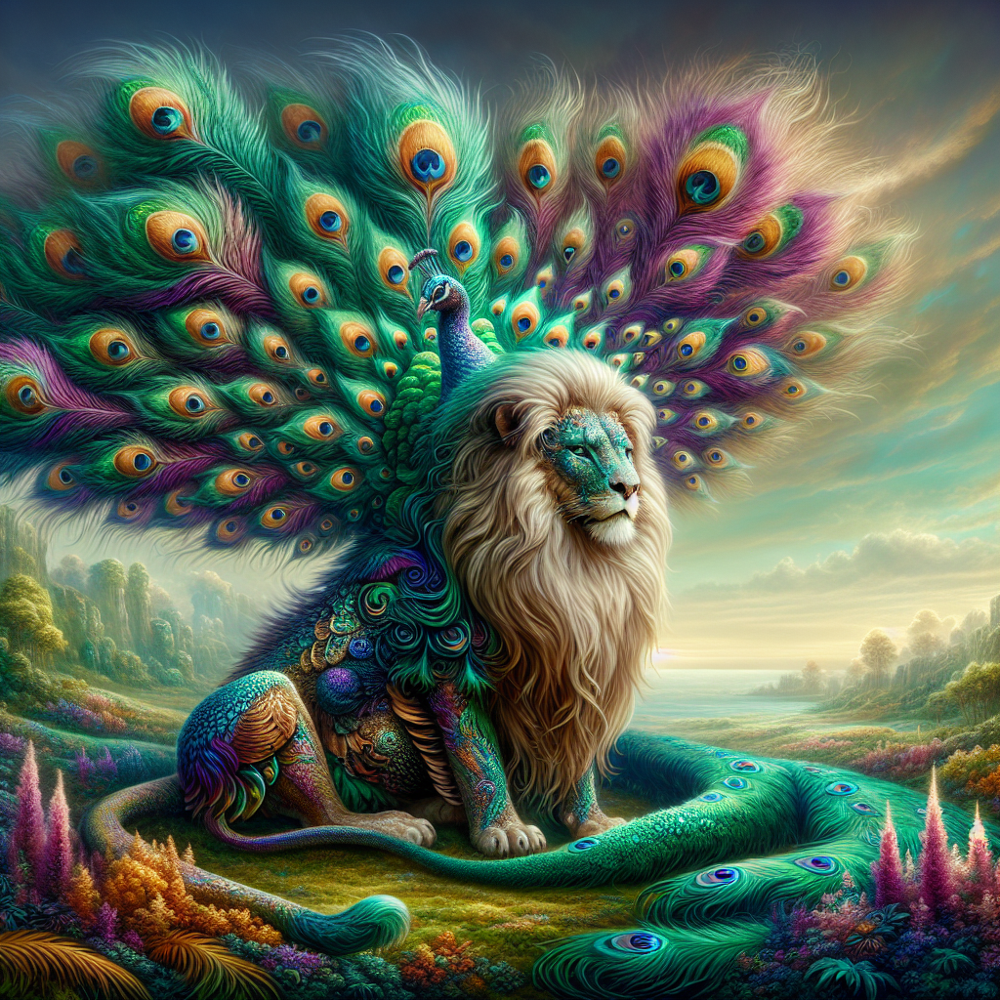

In [40]:
# GPT-4o가 만든 프롬프트로 이미지 생성
gpt_described_image_url = generate_image_dalle3(described_result)
gpt4o_prompt_image = get_generated_image(gpt_described_image_url)
gpt4o_prompt_image

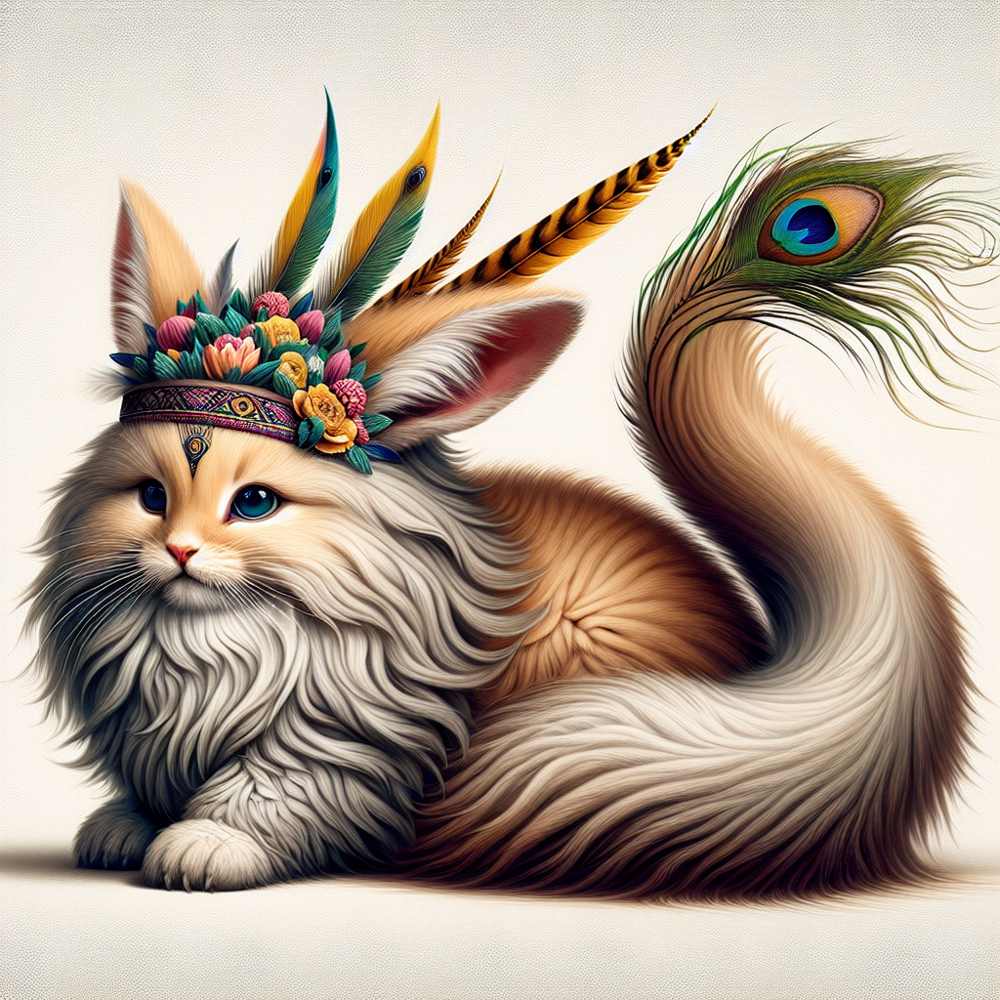

In [41]:
# 원본 프롬프트로 이미지 생성
original_prompt_image_url = generate_image_dalle3(original_prompt)
original_prompt_image = get_generated_image(original_prompt_image_url)
original_prompt_image

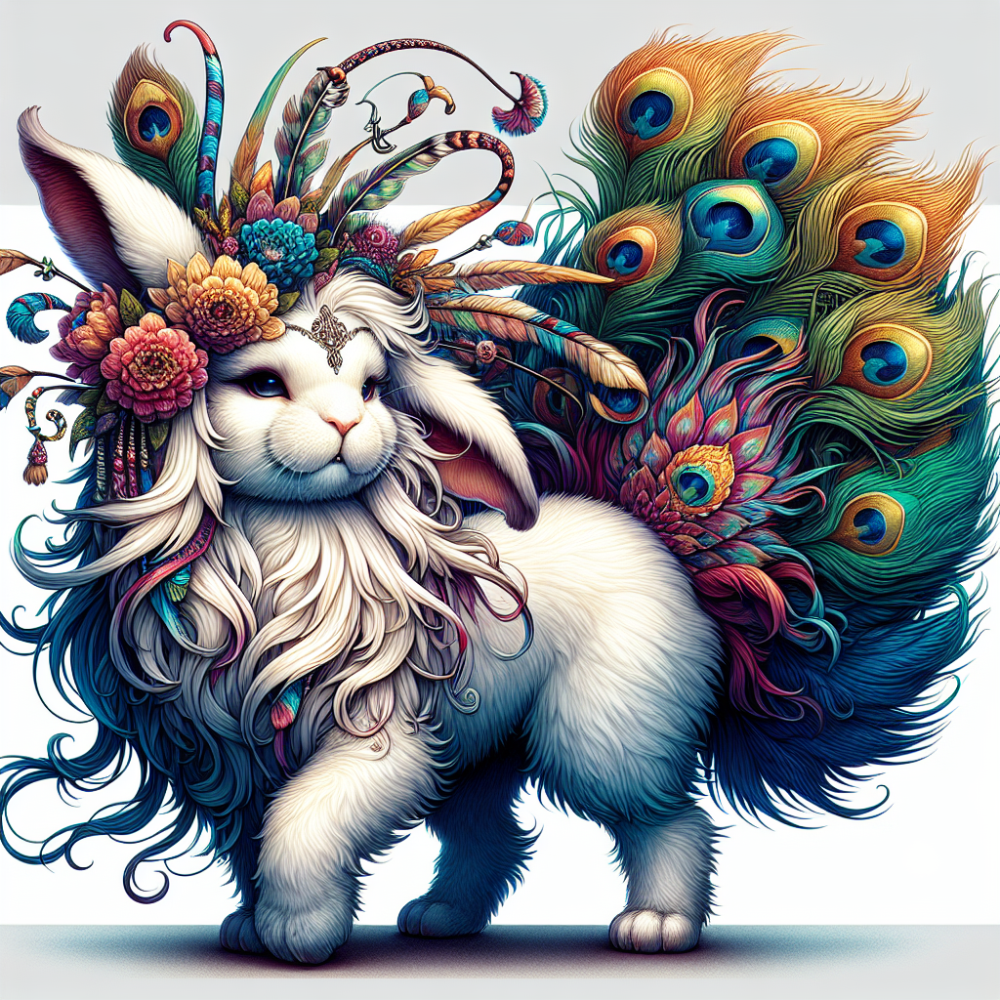

In [42]:
# 이미지 임베딩으로 검색한 유사 프롬프트로 이미지 생성
searched_prompt_image_url = generate_image_dalle3(dataset[searched_idx]['prompt'])
searched_prompt_image = get_generated_image(searched_prompt_image_url)
searched_prompt_image

## 예제 12.25 이미지 출력

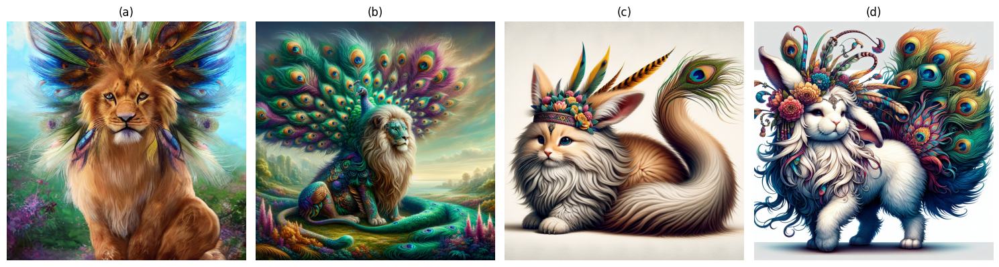

In [43]:
import matplotlib.pyplot as plt

images = [original_image, gpt4o_prompt_image, original_prompt_image, searched_prompt_image]
titles = ['(a)', '(b)', '(c)', '(d)']

fig, axes = plt.subplots(1, len(images), figsize=(15, 5))

for ax, img, title in zip(axes, images, titles):
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(title)

plt.tight_layout()
plt.show()